In [1]:
import netCDF4
from matplotlib import cm
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import wradlib as wrl
import pyart
import warnings
warnings.filterwarnings('ignore')
try:
    get_ipython().magic("matplotlib inline")
except:
    pl.ion()
import numpy as np


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



In [2]:
radar=pyart.io.read('MDV-20150805-143535-PPIVol.nc')
print(radar.fields.keys())
radar.info('compact')

dict_keys(['DBZH', 'DBZV', 'VELH', 'VELV'])
altitude: <ndarray of type: float64 and shape: (1,)>
altitude_agl: None
antenna_transition: None
azimuth: <ndarray of type: float32 and shape: (9270,)>
elevation: <ndarray of type: float32 and shape: (9270,)>
fields:
	DBZH: <ndarray of type: float32 and shape: (9270, 2500)>
	DBZV: <ndarray of type: float32 and shape: (9270, 2500)>
	VELH: <ndarray of type: float32 and shape: (9270, 2500)>
	VELV: <ndarray of type: float32 and shape: (9270, 2500)>
fixed_angle: <ndarray of type: float32 and shape: (18,)>
instrument_parameters:
	frequency: <ndarray of type: float32 and shape: (1,)>
	pulse_width: <ndarray of type: float32 and shape: (9270,)>
	prt_mode: <ndarray of type: |S1 and shape: (18, 10)>
	prt: <ndarray of type: float32 and shape: (9270,)>
	prt_ratio: <ndarray of type: float32 and shape: (9270,)>
	polarization_mode: <ndarray of type: |S1 and shape: (18, 10)>
	nyquist_velocity: <ndarray of type: float32 and shape: (9270,)>
	n_samples: <ndarray

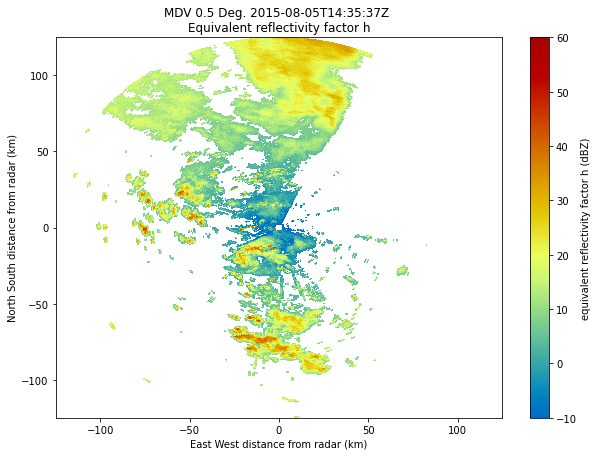

In [3]:
# create the plot using RadarDisplay
display = pyart.graph.RadarDisplay(radar)
fig = plt.figure(figsize=[10, 7])
ax = fig.add_subplot(111)
display.plot('DBZH', 0, vmin=-10, vmax=60.0)
plt.show()

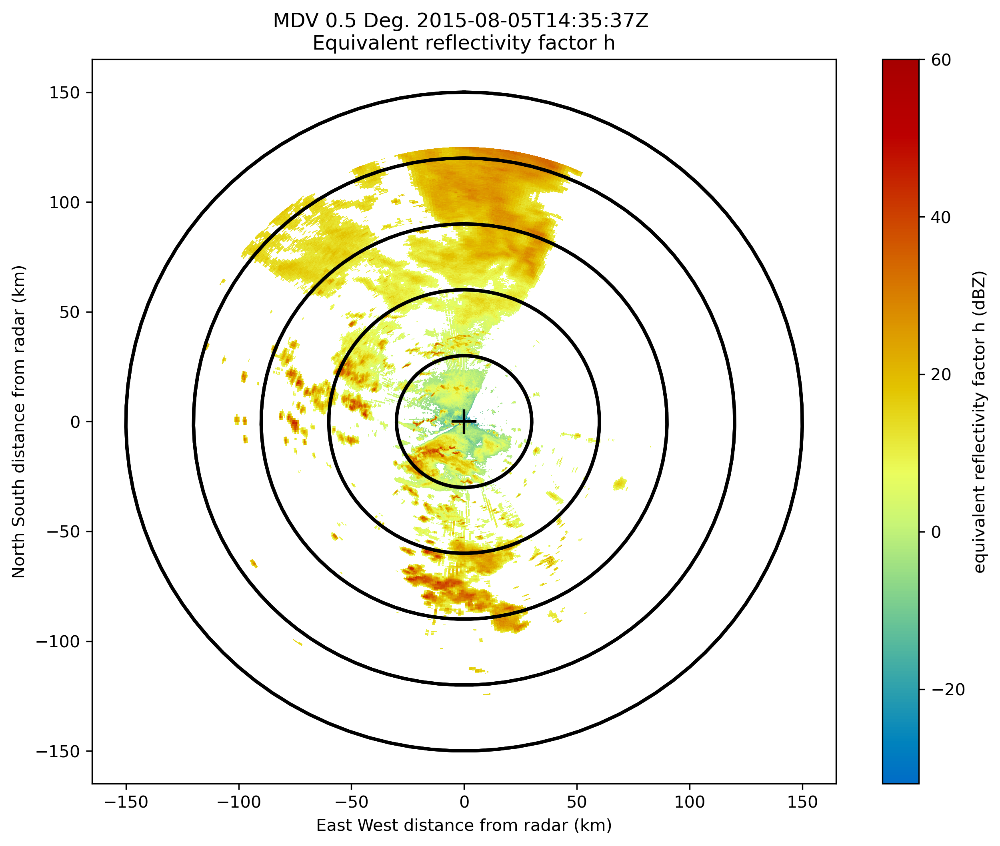

In [4]:
# create the plot using RadarDisplay (recommended method)
display = pyart.graph.RadarDisplay(radar)
fig = plt.figure(figsize=[10,8],dpi=300)
ax = fig.add_subplot(111)
display.plot('DBZH', 0, vmin=-32, vmax=60)
display.plot_range_rings([30, 60,  90, 120, 150])
display.plot_range_rings([30, 60,  90, 120, 150])
display.plot_cross_hair(5.)
plt.show()

# Plot a cross section from a PPI volume
An example which extracts a cross section at two azimuth angles from a volume of PPI scans and plots both cross sections.

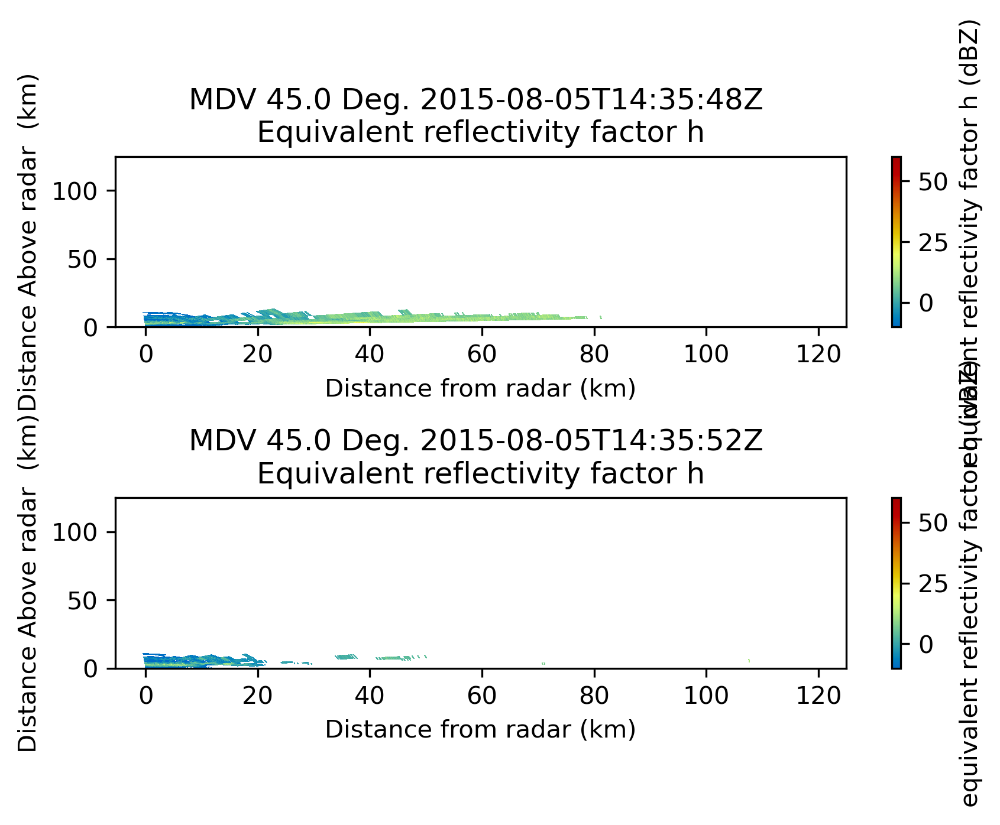

In [5]:
xsect = pyart.util.cross_section_ppi(radar, [45, 90, 135])

display = pyart.graph.RadarDisplay(xsect)
fig = plt.figure(dpi=300)
ax = fig.add_subplot(211)
display.plot('DBZH', 0, vmin=-10, vmax=60)
ax = fig.add_subplot(212)
display.plot('DBZH', sweep=1, vmin=-10, vmax=60)
plt.tight_layout()
plt.show()

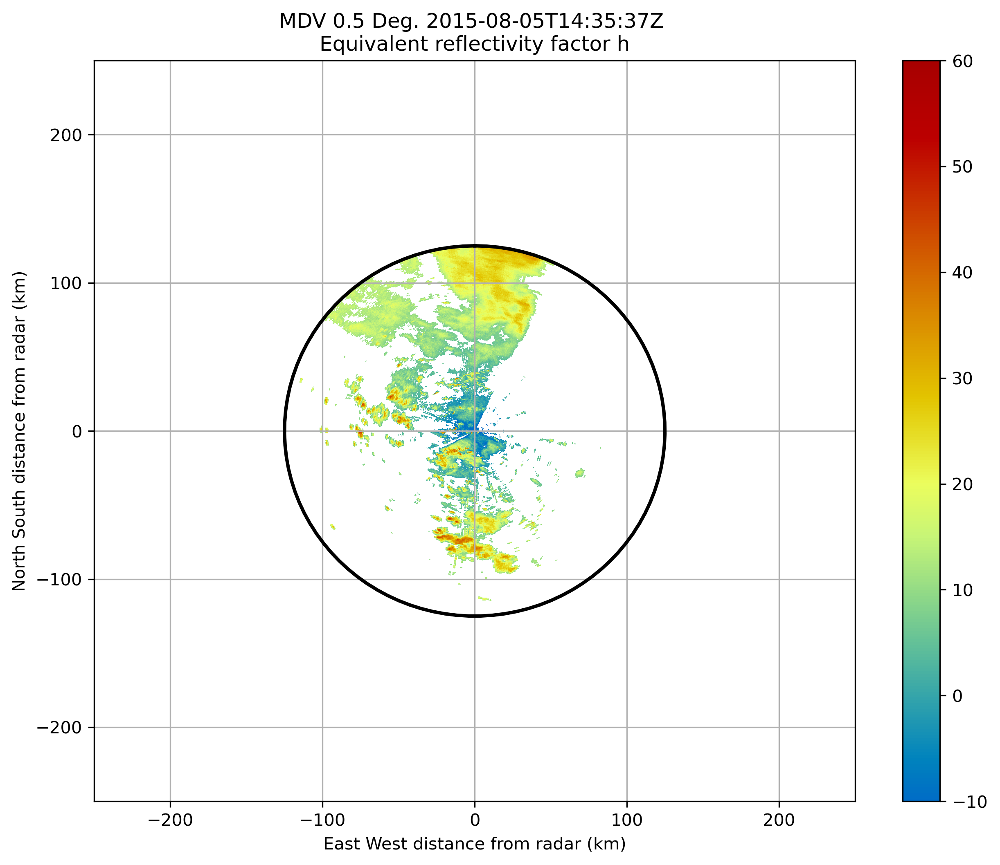

In [6]:
# create the displays and figure
display = pyart.graph.RadarDisplay(radar)
fig = plt.figure(figsize=(10, 8),dpi=300)

# plot super resolution reflectivity
ax = fig.add_subplot(111)
display.plot('DBZH', 0, vmin=-10, vmax=60, colorbar_label='', ax=ax)
display.plot_range_ring(radar.range['data'][-1]/1000., ax=ax)
display.set_limits(xlim=(-250, 250), ylim=(-250, 250), ax=ax)
plt.grid()
plt.show()

#Create a RHI plot
display = pyart.graph.RadarDisplay(radar)

fig = plt.figure(figsize=[10, 4])
ax = fig.add_subplot(111)

instrument_name = radar.metadata['instrument_name']
time_start = netCDF4.num2date(radar.time['data'][0], radar.time['units'])
time_text = ' ' + time_start.strftime('%Y-%m-%dT%H:%M:%SZ')
azimuth = radar.fixed_angle['data'][0]
title = 'RHI ' + instrument_name + time_text + 'Azimuth %.2f' % (azimuth)

display.plot('DBZH', 0, vmin=-10, vmax=60,
             title=title, colorbar_flag=False, ax=ax)
display.set_limits(ylim=[0, 17])

cax = fig.add_axes([.9, .1, 0.02, .8])
colorbar_label = 'Eq refl fact (dBz)'
display.plot_colorbar(fig=fig, cax=cax, label=colorbar_label)

plt.show()

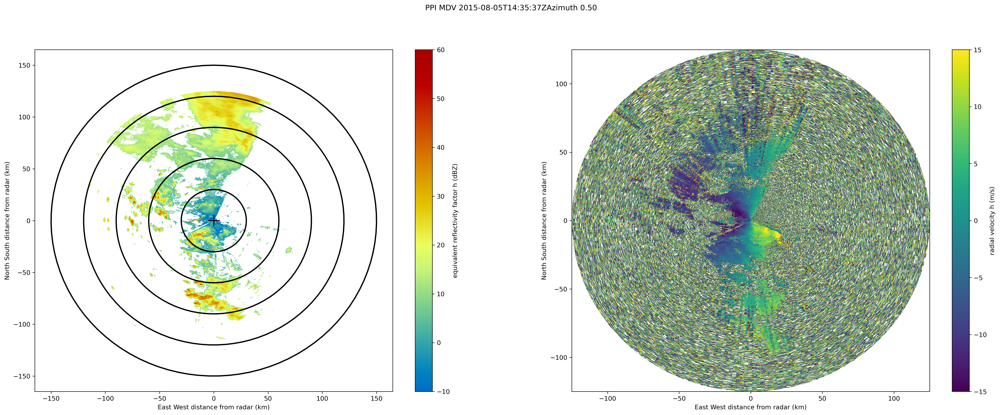

In [7]:
display = pyart.graph.RadarDisplay(radar)

# fields to plot and ranges
fields_to_plot = ['DBZH', 'VELH']
ranges = [(-10, 60), (-15, 15)]

# plot the data
nplots = len(fields_to_plot)
plt.figure(figsize=[14 * nplots, 10],dpi=300)

# plot each field
for plot_num in range(nplots):
    field = fields_to_plot[plot_num]
    vmin, vmax = ranges[plot_num]
    
    display.plot_range_rings([30, 60,  90, 120, 150])
    display.plot_cross_hair(5.)

    plt.subplot(1, nplots, plot_num + 1)
    display.plot(field, 0, vmin=vmin, vmax=vmax, title_flag=False)
    #display.set_limits(ylim=[0, 17])

# set the figure title and show
instrument_name = radar.metadata['instrument_name']
time_start = netCDF4.num2date(radar.time['data'][0], radar.time['units'])
time_text = ' ' + time_start.strftime('%Y-%m-%dT%H:%M:%SZ')
azimuth = radar.fixed_angle['data'][0]
title = 'PPI ' + instrument_name + time_text + 'Azimuth %.2f' % (azimuth)
plt.suptitle(title)
plt.show()


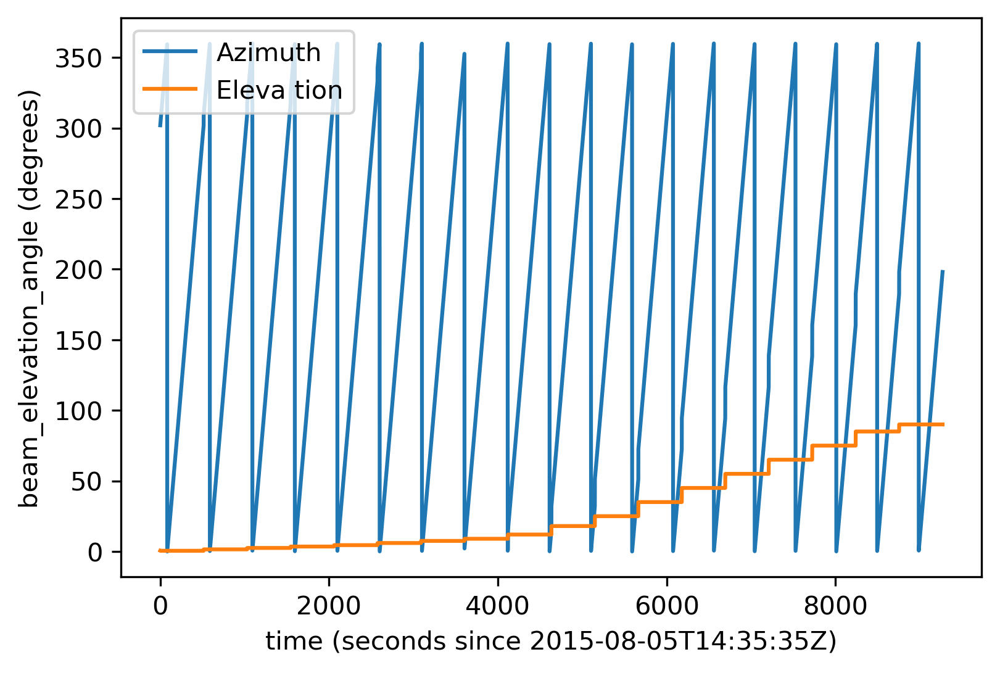

In [8]:
ele = radar.elevation['data']
azm = radar.azimuth['data']
plt.figure(dpi=300)
plt.plot(azm)
plt.plot(ele)

plt.ylabel(radar.elevation['standard_name'] + ' (' + radar.elevation['units'] + ')')
plt.xlabel(radar.time['standard_name'] + ' (' + radar.time['units'] + ')')
plt.legend(['Azimuth','Eleva tion'])

In [9]:
radar.instrument_parameters.keys()

dict_keys(['frequency', 'pulse_width', 'prt_mode', 'prt', 'prt_ratio', 'polarization_mode', 'nyquist_velocity', 'n_samples', 'radar_antenna_gain_h', 'radar_antenna_gain_v', 'radar_beam_width_h', 'radar_beam_width_v', 'radar_receiver_bandwidth', 'radar_measured_transmit_power_h', 'radar_measured_transmit_power_v'])

In [10]:
frq = radar.instrument_parameters['frequency']['data']
frq.shape, radar.instrument_parameters['frequency']['units']

((1,), 's-1')

In [11]:
pw = radar.instrument_parameters['pulse_width']['data']

pw.shape

(9270,)

In [12]:
rg = radar.range['data']
rg.shape

(2500,)

Text(0, 0.5, 'projection_range_coordinatemeters')

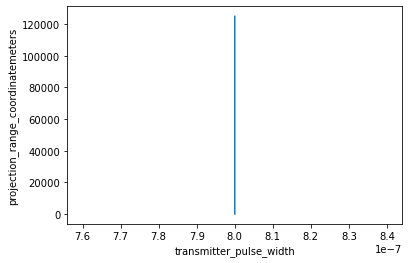

In [13]:
plt.plot(radar.instrument_parameters['pulse_width']['data'][0:2500],rg)
plt.xlabel(radar.instrument_parameters['pulse_width']['standard_name'])
plt.ylabel(radar.range['standard_name']+radar.range['units'])

In [14]:
radar.instrument_parameters['pulse_width']['units'],radar.range['units']

('seconds', 'meters')

In [15]:

ns = radar.instrument_parameters['n_samples']['data']
ns.shape

(9270,)

In [16]:
t = radar.time['data']
t

masked_array(data=[  2.,   2.,   2., ..., 676., 676., 676.],
             mask=False,
       fill_value=1e+20)

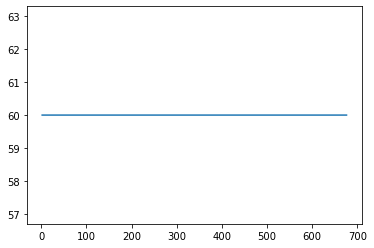

In [17]:
plt.plot(t,ns)

# Using Wradlib Module

In [18]:
Z = radar.fields['DBZH']['data']
Z

masked_array(
  data=[[6.0, 9.0, -12.5, ..., --, --, --],
        [6.0, 9.0, -13.0, ..., --, --, --],
        [7.5, 9.5, -12.5, ..., --, --, --],
        ...,
        [6.5, 7.5, -13.5, ..., --, --, --],
        [6.5, 6.0, -14.5, ..., --, --, --],
        [7.0, 7.0, -12.5, ..., --, --, --]],
  mask=[[False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True],
        ...,
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True]],
  fill_value=-32768,
  dtype=float32)

In [19]:

wradar = wrl.io.read_generic_netcdf('MDV-20150805-143535-PPIVol.nc')
#wradar

In [20]:
#Rainfall Rate Calculation (Feature of wradlib)
R = wrl.zr.z_to_r(Z, a=200., b=1.6)
R

masked_array(
  data=[[0.11173797398805618, 0.14396530389785767, --, ..., --, --, --],
        [0.11173797398805618, 0.14396530389785767, --, ..., --, --, --],
        [0.12846048176288605, 0.14891330897808075, --, ..., --, --, --],
        ...,
        [0.11747003346681595, 0.12846048176288605, --, ..., --, --, --],
        [0.11747003346681595, 0.11173797398805618, --, ..., --, --, --],
        [0.12303892523050308, 0.12303892523050308, --, ..., --, --, --]],
  mask=[[False, False,  True, ...,  True,  True,  True],
        [False, False,  True, ...,  True,  True,  True],
        [False, False,  True, ...,  True,  True,  True],
        ...,
        [False, False,  True, ...,  True,  True,  True],
        [False, False,  True, ...,  True,  True,  True],
        [False, False,  True, ...,  True,  True,  True]],
  fill_value=-32768,
  dtype=float32)

In [21]:
#Convert to rainfall depth (unit: mm) assuming a rainfall duration of five minutes (i.e. 300 seconds)
depth = wrl.trafo.r_to_depth(R, 300)
depth.shape

(9270, 2500)

In [22]:
#Adding variable to Dataset for plotting
mask_dict = {'data': R, 'units': 'mm/hr', 'long_name': 'rain rate',
             '_FillValue': R.fill_value, 'standard_name': 'R'}
radar.add_field('R',mask_dict)

In [23]:
radar.range

{'standard_name': 'projection_range_coordinate',
 'long_name': 'range_to_measurement_volume',
 'units': 'meters',
 'spacing_is_constant': 'true',
 'meters_to_center_of_first_gate': 25.0,
 'meters_between_gates': 50.0,
 'axis': 'radial_range_coordinate',
 'data': masked_array(data=[2.50000e+01, 7.50000e+01, 1.25000e+02, ...,
                    1.24875e+05, 1.24925e+05, 1.24975e+05],
              mask=False,
        fill_value=1e+20,
             dtype=float32)}

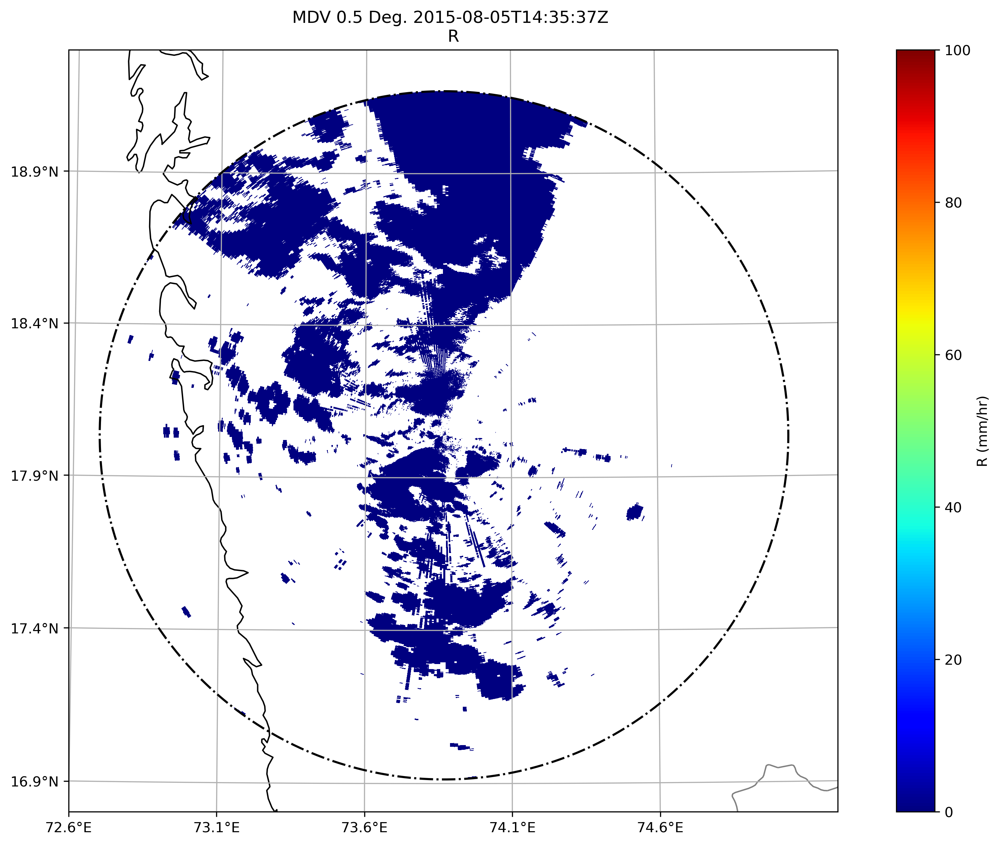

In [24]:
fig = plt.figure(figsize=(15,10),dpi=300)
display = pyart.graph.RadarMapDisplay(radar)
display.plot_ppi_map('R',0, vmin=0, vmax=100, min_lon=72.6, max_lon=75.2, min_lat=16.8, max_lat=19.3,
                     lon_lines=np.arange(72.6,75, .5), resolution='10m',
                     lat_lines=np.arange(16.9,19.3, .5),
                     fig=fig, lat_0=radar.latitude['data'][0],
                     lon_0=radar.longitude['data'][0],cmap='jet')

#display.plot_range_ring(30., line_style='k-')
#display.plot_range_ring(60., line_style='k--')
#display.plot_range_ring(90., line_style='k-')
display.plot_range_ring(radar.range['data'][2], line_style='k-.')
#plt.barbs(lon,lat,VELH,VELV)

In [25]:
radar.info()

altitude:
	data: <ndarray of type: float64 and shape: (1,)>
	standard_name: altitude
	units: meters
altitude_agl: None
antenna_transition: None
azimuth:
	data: <ndarray of type: float32 and shape: (9270,)>
	standard_name: beam_azimuth_angle
	long_name: azimuth_angle_from_true_north
	units: degrees
	axis: radial_azimuth_coordinate
elevation:
	data: <ndarray of type: float32 and shape: (9270,)>
	standard_name: beam_elevation_angle
	long_name: elevation_angle_from_horizontal_plane
	units: degrees
	axis: radial_elevation_coordinate
fields:
	DBZH:
		data: <ndarray of type: float32 and shape: (9270, 2500)>
		long_name: equivalent_reflectivity_factor_h
		units: dBZ
		_FillValue: -32768
		coordinates: elevation azimuth range
	DBZV:
		data: <ndarray of type: float32 and shape: (9270, 2500)>
		long_name: equivalent_reflectivity_factor_v
		units: dBZ
		_FillValue: -32768
		coordinates: elevation azimuth range
	VELH:
		data: <ndarray of type: float32 and shape: (9270, 2500)>
		long_name: radial_ve

In [26]:
lat = radar.latitude['data']
lon = radar.longitude['data']
alt = radar.altitude['data']
lat.shape,lon.shape,alt.shape

((1,), (1,), (1,))

In [27]:
#lon, lat = np.meshgrid(lon,lat)

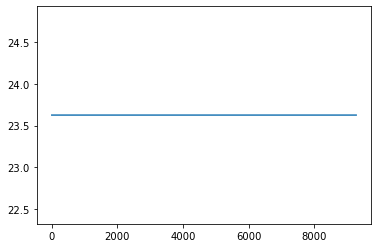

In [28]:
plt.plot(radar.instrument_parameters['nyquist_velocity']['data'])

In [29]:
r1 = radar.range

In [30]:
r1.keys()

dict_keys(['standard_name', 'long_name', 'units', 'spacing_is_constant', 'meters_to_center_of_first_gate', 'meters_between_gates', 'axis', 'data'])

In [31]:
VELH = radar.fields['VELH']['data']
VELV = radar.fields['VELV']['data']
DBZH = radar.fields['DBZH']['data']
VELH.shape, DBZH.shape

((9270, 2500), (9270, 2500))

In [32]:
lons = radar.longitude['data']
lats = radar.latitude['data']

ValueError: The shapes of the passed in arrays do not match

<Figure size 432x288 with 0 Axes>

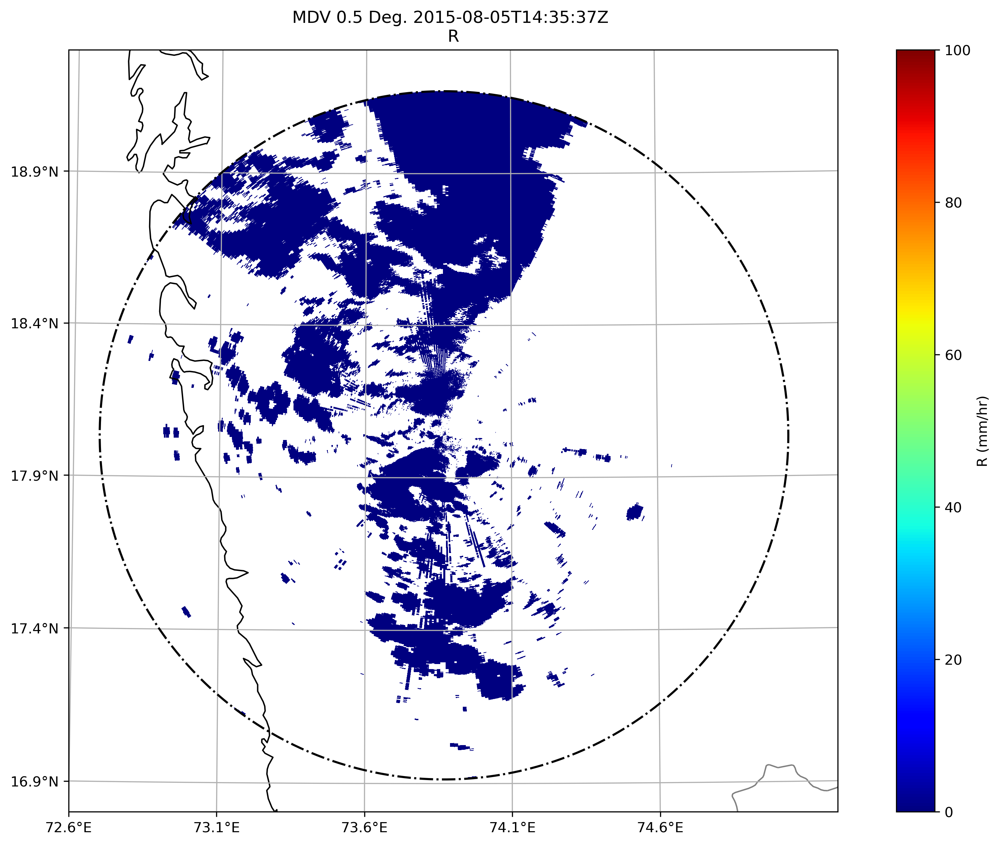

In [33]:
fig = plt.figure()
fig = plt.figure(figsize=(15,10),dpi=300)
display = pyart.graph.RadarMapDisplay(radar)
display.plot_ppi_map('R',0, vmin=0, vmax=100, min_lon=72.6, max_lon=75.2, min_lat=16.8, max_lat=19.3,
                     lon_lines=np.arange(72.6,75, .5), resolution='10m',
                     lat_lines=np.arange(16.9,19.3, .5),
                     fig=fig, lat_0=radar.latitude['data'][0],
                     lon_0=radar.longitude['data'][0],cmap='jet')

#display.plot_range_ring(30., line_style='k-')
#display.plot_range_ring(60., line_style='k--')
#display.plot_range_ring(90., line_style='k-')
display.plot_range_ring(radar.range['data'][2], line_style='k-.')
plt.barbs(lons,lats,VELH,VELV)

In [ ]:
x = array
x.shape


In [ ]:
data2 = np.array(data, dtype=[('lon1', np.float32), ('lat1', np.float32),
                             ('VELH', np.float32), ('VELV', np.float32)])